# Multiple Plots and Subplots

Data visualizations often require comparing multiple datasets or showing different aspects of the same data side by side. Creating multiple plots in a single figure helps tell a complete data story and facilitates comparisons. This notebook covers various techniques for creating and customizing subplots using Python's visualization libraries.

## Learning Objectives:
- Create basic subplot layouts with matplotlib
- Understand Figure and Axes objects
- Configure complex grid arrangements
- Adjust spacing and proportions
- Create shared-axis plots
- Build specialized multi-plot visualizations
- Add comprehensive titles and annotations
- Create interactive multi-plot dashboards

## 1. Import Required Libraries

First, we'll import the necessary libraries for creating plots and subplots:
- **Matplotlib**: The foundational plotting library in Python
- **Seaborn**: Built on matplotlib with enhanced aesthetics and statistical plotting
- **Plotly**: For interactive visualizations and dashboards
- **NumPy** and **Pandas**: For data manipulation

In [1]:
# Import required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Set seaborn style for better aesthetics
sns.set(style="whitegrid")

# Configure matplotlib for better display in the notebook
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

# Sample data for plotting
np.random.seed(42)
x = np.linspace(0, 10, 100)
y1 = np.sin(x)
y2 = np.cos(x)
y3 = np.exp(-0.1*x) * np.sin(x)
y4 = x**2 / 30

# Create a sample dataframe
df = pd.DataFrame({
    'x': x,
    'sin': y1,
    'cos': y2,
    'damped': y3,
    'quadratic': y4
})

# Print the first few rows of our dataset
df.head()

,x,sin,cos,damped,quadratic
0,0.00000,0.000000,1.000000,0.000000,0.000000
1,0.10101,0.100838,0.994903,0.099825,0.000340
2,0.20202,0.200649,0.979663,0.196636,0.001360
3,0.30303,0.298414,0.954437,0.289507,0.003061
4,0.40404,0.393137,0.919480,0.377569,0.005442


## 2. Basic Subplot Creation

The simplest way to create subplots in matplotlib is using the `plt.subplots()` function. This function returns a figure object and an array of axes objects that you can use to customize each subplot.

### Basic 2x2 Grid Example

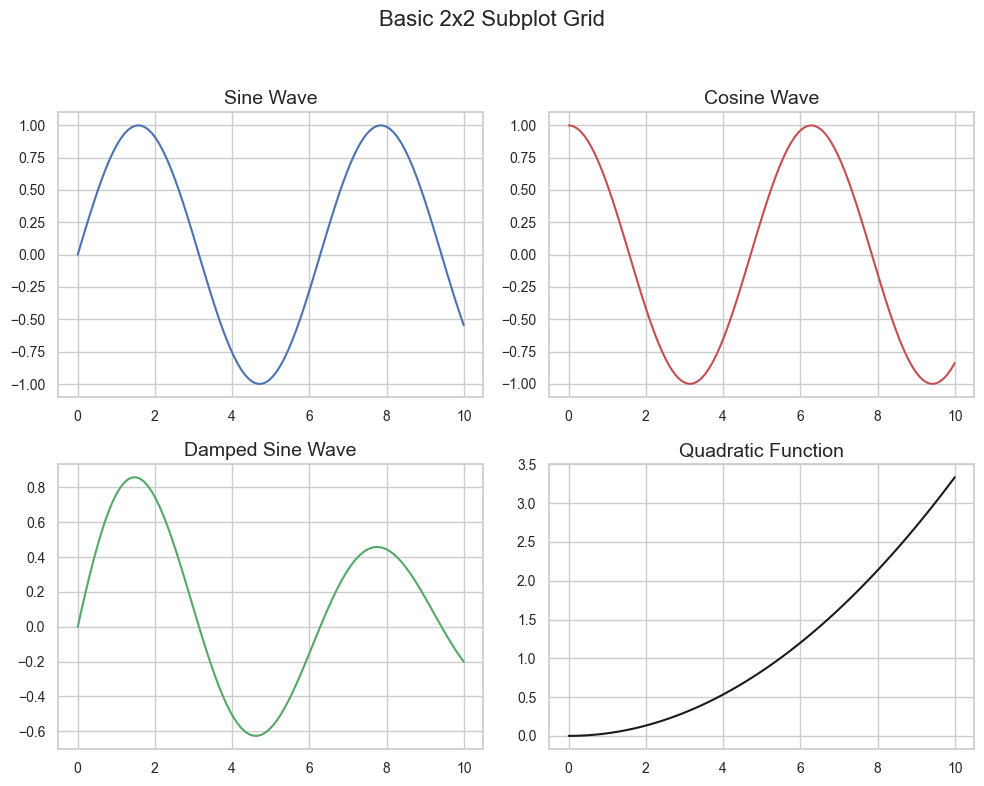

In [2]:
# Create a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(10, 8))

# Plot different data on each subplot
axs[0, 0].plot(x, y1, 'b-')
axs[0, 0].set_title('Sine Wave')

axs[0, 1].plot(x, y2, 'r-')
axs[0, 1].set_title('Cosine Wave')

axs[1, 0].plot(x, y3, 'g-')
axs[1, 0].set_title('Damped Sine Wave')

axs[1, 1].plot(x, y4, 'k-')
axs[1, 1].set_title('Quadratic Function')

# Add a main title to the figure
fig.suptitle('Basic 2x2 Subplot Grid', fontsize=16)

# Adjust spacing between subplots
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Leave room for suptitle

plt.show()

### Basic 1D Subplot Array

When creating a single row or column of subplots, matplotlib returns a 1D array of axes.

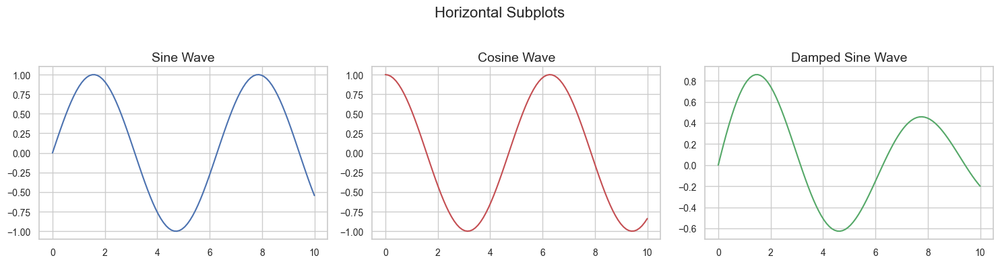

In [3]:
# Create a 1x3 grid (one row, three columns)
fig, axs = plt.subplots(1, 3, figsize=(15, 4))

# Plot different data on each subplot
axs[0].plot(x, y1, 'b-')
axs[0].set_title('Sine Wave')

axs[1].plot(x, y2, 'r-')
axs[1].set_title('Cosine Wave')

axs[2].plot(x, y3, 'g-')
axs[2].set_title('Damped Sine Wave')

# Add a main title
fig.suptitle('Horizontal Subplots', fontsize=16)

# Adjust spacing
plt.tight_layout(rect=[0, 0, 1, 0.95])

plt.show()

## 3. Figure and Axes Objects

In matplotlib, visualization is organized around two main objects:
- **Figure**: The overall figure container
- **Axes**: The individual plots

Understanding this hierarchy is crucial for customizing complex subplot arrangements.

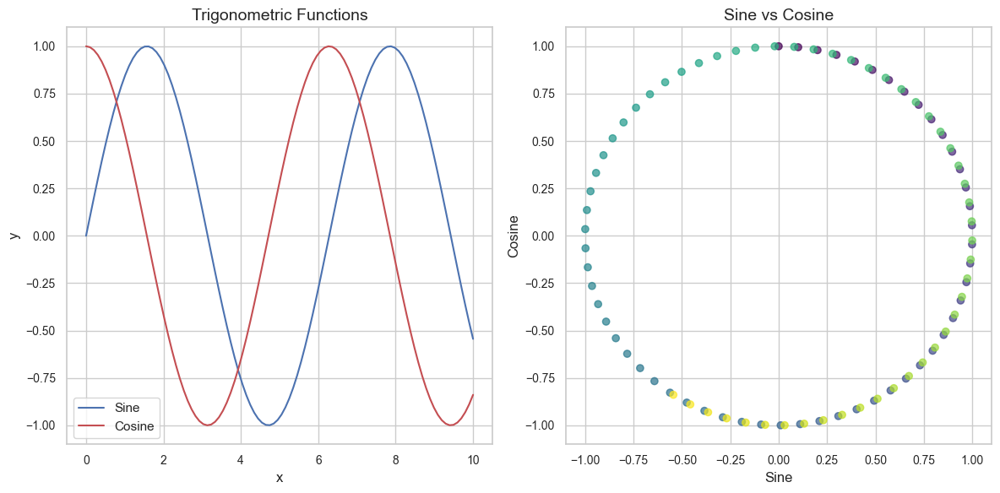

In [4]:
# Create a figure with a specific size
fig = plt.figure(figsize=(12, 6))

# Add axes to the figure manually
# add_subplot(rows, columns, index)
ax1 = fig.add_subplot(1, 2, 1)  # Left plot
ax2 = fig.add_subplot(1, 2, 2)  # Right plot

# Use axes objects for plotting
ax1.plot(x, y1, 'b-', label='Sine')
ax1.plot(x, y2, 'r-', label='Cosine')
ax1.set_title('Trigonometric Functions')
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax1.legend()
ax1.grid(True)

# Create a scatter plot on the second axes
ax2.scatter(y1, y2, c=x, cmap='viridis', alpha=0.7)
ax2.set_title('Sine vs Cosine')
ax2.set_xlabel('Sine')
ax2.set_ylabel('Cosine')
ax2.grid(True)

plt.tight_layout()
plt.show()

### Using both Figure-level and Axes-level commands

You can mix figure-level and axes-level commands to customize plots efficiently.

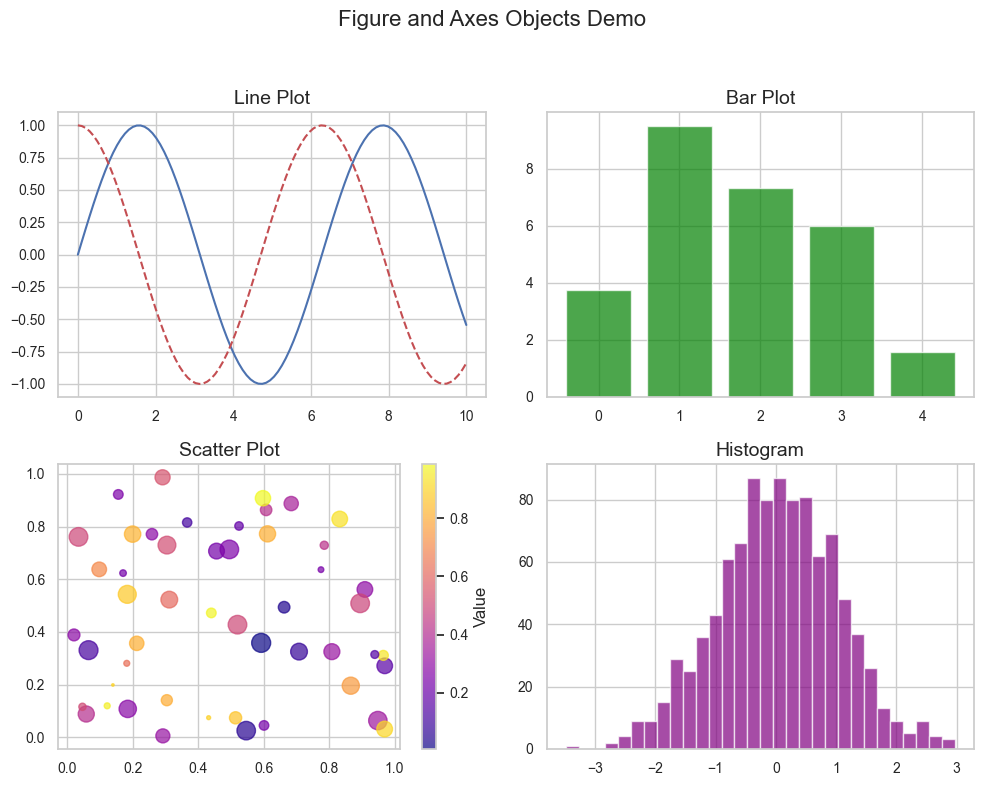

In [5]:
# Create a figure with 4 subplots
fig, axs = plt.subplots(2, 2, figsize=(10, 8))

# Figure-level customization
fig.suptitle('Figure and Axes Objects Demo', fontsize=16)

# Flatten the 2x2 array into a 1D array for easier iteration
axs = axs.flatten()

# Different plot types on each subplot
axs[0].plot(x, y1, 'b-')
axs[0].plot(x, y2, 'r--')
axs[0].set_title('Line Plot')

# Bar chart
axs[1].bar(np.arange(5), np.random.rand(5)*10, color='green', alpha=0.7)
axs[1].set_title('Bar Plot')

# Scatter plot
scatter = axs[2].scatter(
    np.random.rand(50), 
    np.random.rand(50), 
    c=np.random.rand(50), 
    s=np.random.rand(50)*200,
    cmap='plasma',
    alpha=0.7
)
axs[2].set_title('Scatter Plot')
fig.colorbar(scatter, ax=axs[2], label='Value')

# Histogram
axs[3].hist(np.random.normal(0, 1, 1000), bins=30, alpha=0.7, color='purple')
axs[3].set_title('Histogram')

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Leave space for the suptitle
plt.show()

## 4. Subplot Grid Layouts

There are several ways to create subplot grids in matplotlib:
1. `plt.subplots(rows, cols)`: The standard approach
2. `plt.subplot(rows, cols, index)`: For individual subplot creation
3. `GridSpec`: For more complex layouts

Let's explore each method and understand their use cases.

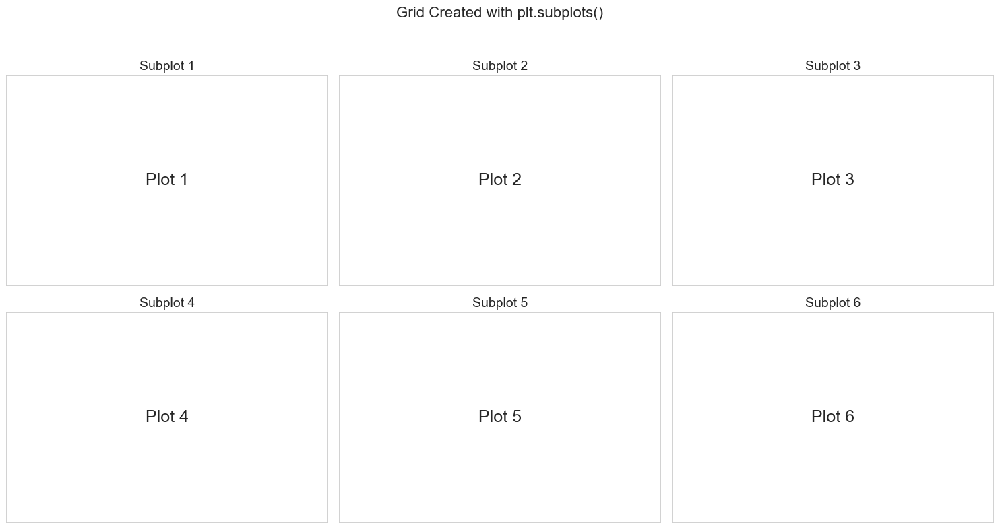

In [6]:
# Method 1: Using plt.subplots()
fig, axs = plt.subplots(2, 3, figsize=(15, 8))

# Iterate over all subplots
for i in range(2):
    for j in range(3):
        index = i*3 + j + 1
        axs[i, j].text(0.5, 0.5, f'Plot {index}', 
                      horizontalalignment='center',
                      verticalalignment='center',
                      fontsize=18)
        axs[i, j].set_title(f'Subplot {index}')
        axs[i, j].set_xticks([])
        axs[i, j].set_yticks([])

fig.suptitle('Grid Created with plt.subplots()', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

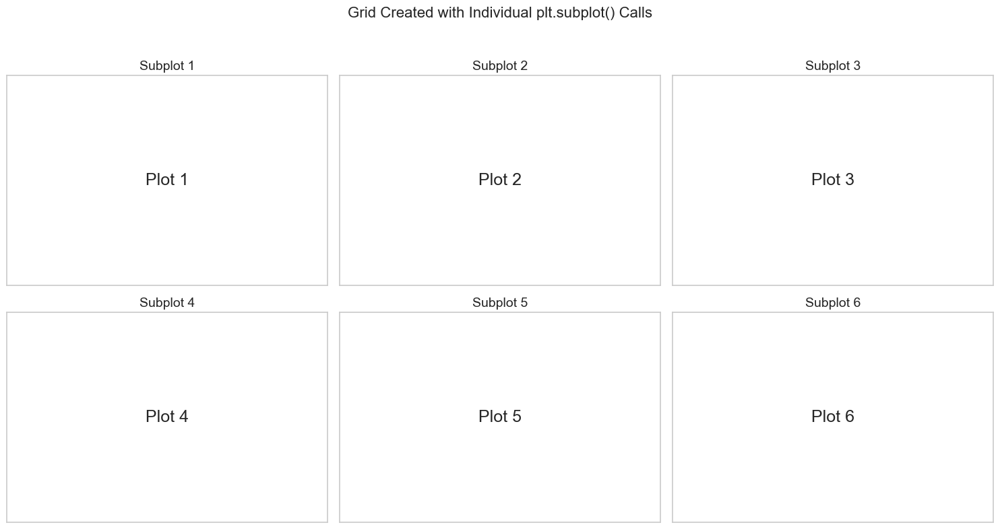

In [7]:
# Method 2: Using plt.subplot() individually
fig = plt.figure(figsize=(15, 8))

# Create each subplot individually
for i in range(1, 7):
    ax = plt.subplot(2, 3, i)  # 2 rows, 3 columns, index i
    ax.text(0.5, 0.5, f'Plot {i}', 
            horizontalalignment='center',
            verticalalignment='center',
            fontsize=18)
    ax.set_title(f'Subplot {i}')
    ax.set_xticks([])
    ax.set_yticks([])

fig.suptitle('Grid Created with Individual plt.subplot() Calls', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

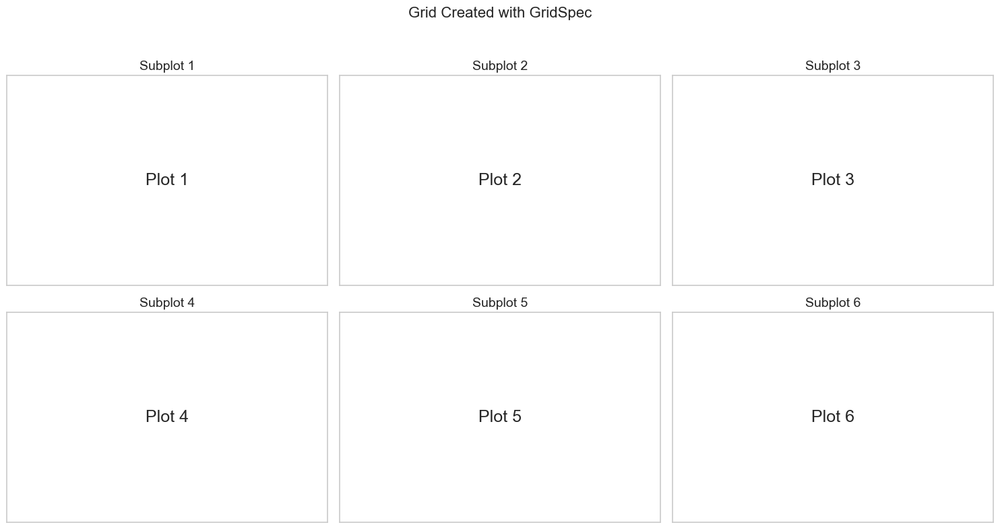

In [8]:
# Method 3: Using GridSpec
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize=(15, 8))
gs = gridspec.GridSpec(2, 3)  # 2 rows, 3 columns

# Create each subplot using the gridspec
for i in range(6):
    row = i // 3
    col = i % 3
    ax = plt.subplot(gs[row, col])
    ax.text(0.5, 0.5, f'Plot {i+1}', 
            horizontalalignment='center',
            verticalalignment='center',
            fontsize=18)
    ax.set_title(f'Subplot {i+1}')
    ax.set_xticks([])
    ax.set_yticks([])

fig.suptitle('Grid Created with GridSpec', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

## 5. Adjusting Subplot Spacing

Controlling the spacing between subplots is essential for creating clean, readable visualizations. There are several methods:

1. `plt.tight_layout()`: Automatically adjusts subplots to fit
2. `plt.subplots_adjust()`: Manually set padding parameters
3. `gridspec` with spacing parameters: Fine-grained control

Let's see each approach in action:

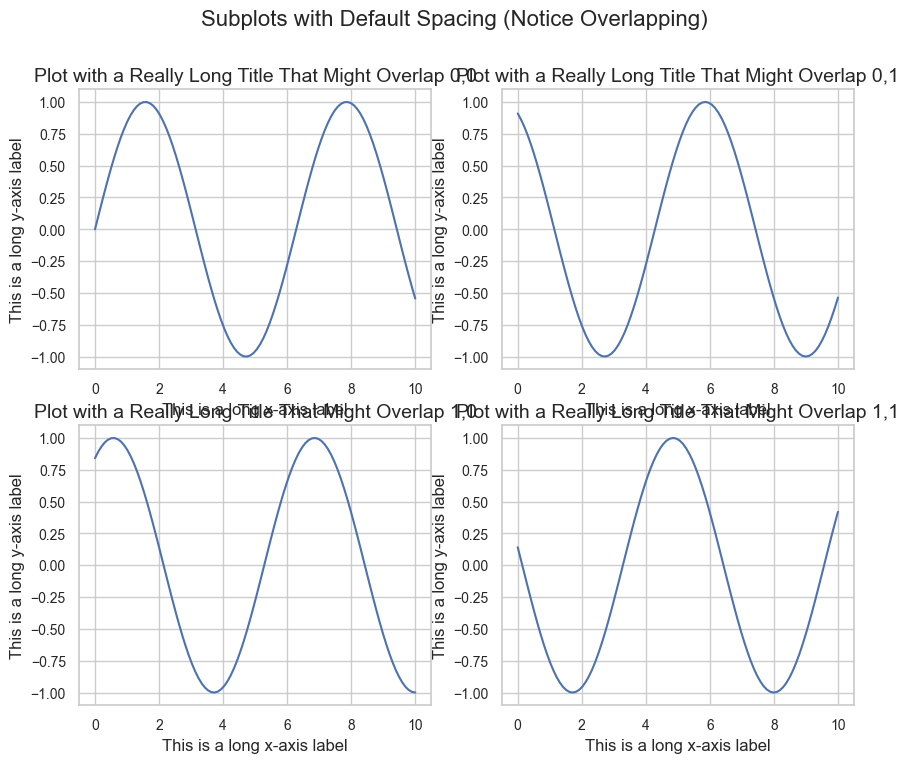

In [9]:
# Create a figure with default spacing (notice the overlap)
fig, axs = plt.subplots(2, 2, figsize=(10, 8))

# Add some content with long labels to show the overlap problem
for i in range(2):
    for j in range(2):
        axs[i, j].plot(x, np.sin(x + i + j*2))
        axs[i, j].set_title(f'Plot with a Really Long Title That Might Overlap {i},{j}')
        axs[i, j].set_xlabel('This is a long x-axis label')
        axs[i, j].set_ylabel('This is a long y-axis label')

fig.suptitle('Subplots with Default Spacing (Notice Overlapping)', fontsize=16)
plt.show()  # Without any spacing adjustment

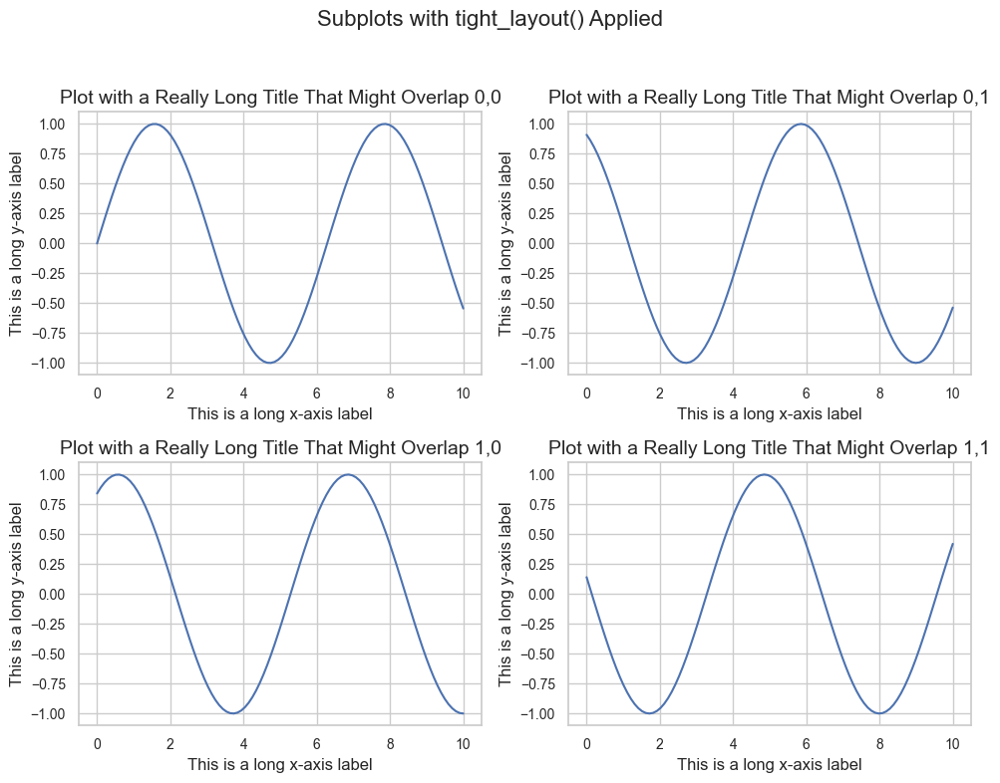

In [10]:
# Solution 1: Using tight_layout
fig, axs = plt.subplots(2, 2, figsize=(10, 8))

# Add the same content
for i in range(2):
    for j in range(2):
        axs[i, j].plot(x, np.sin(x + i + j*2))
        axs[i, j].set_title(f'Plot with a Really Long Title That Might Overlap {i},{j}')
        axs[i, j].set_xlabel('This is a long x-axis label')
        axs[i, j].set_ylabel('This is a long y-axis label')

fig.suptitle('Subplots with tight_layout() Applied', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Leave space for suptitle
plt.show()

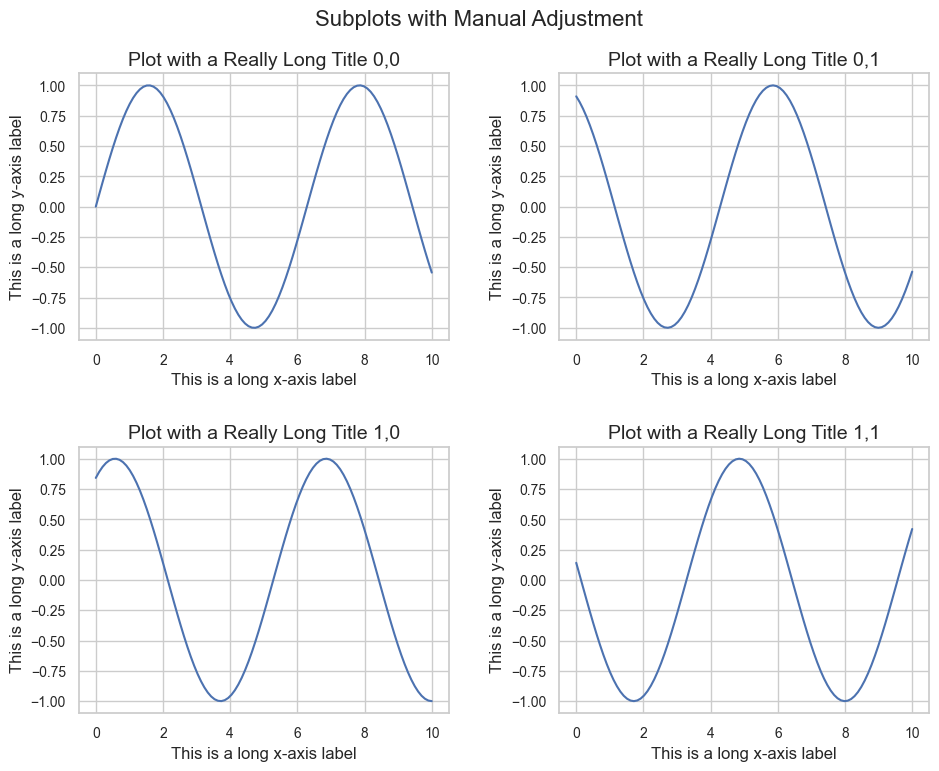

In [11]:
# Solution 2: Manual adjustment with subplots_adjust
fig, axs = plt.subplots(2, 2, figsize=(10, 8))

# Add the same content
for i in range(2):
    for j in range(2):
        axs[i, j].plot(x, np.sin(x + i + j*2))
        axs[i, j].set_title(f'Plot with a Really Long Title {i},{j}')
        axs[i, j].set_xlabel('This is a long x-axis label')
        axs[i, j].set_ylabel('This is a long y-axis label')

fig.suptitle('Subplots with Manual Adjustment', fontsize=16)

# Set explicit spacing parameters
plt.subplots_adjust(
    top=0.9,      # the top of the subplots of the figure
    bottom=0.1,   # the bottom of the subplots of the figure
    left=0.1,     # the left side of the subplots of the figure
    right=0.95,   # the right side of the subplots of the figure
    hspace=0.4,   # height reserved for space between subplots
    wspace=0.3    # width reserved for space between subplots
)

plt.show()

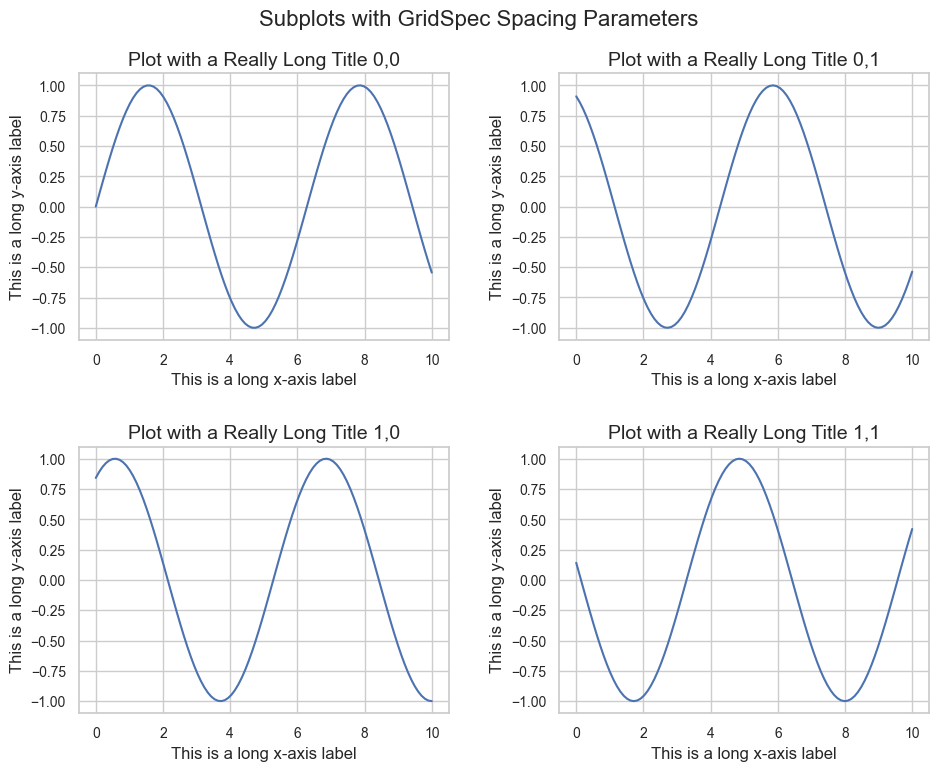

In [12]:
# Solution 3: Using GridSpec with spacing parameters
fig = plt.figure(figsize=(10, 8))

# Create GridSpec with explicit spacing
gs = gridspec.GridSpec(2, 2, 
                      hspace=0.4,  # Height spacing between rows
                      wspace=0.3,  # Width spacing between columns
                      top=0.9,     # Top margin
                      bottom=0.1,  # Bottom margin
                      left=0.1,    # Left margin
                      right=0.95)  # Right margin

# Create subplots using the gridspec
for i in range(2):
    for j in range(2):
        ax = fig.add_subplot(gs[i, j])
        ax.plot(x, np.sin(x + i + j*2))
        ax.set_title(f'Plot with a Really Long Title {i},{j}')
        ax.set_xlabel('This is a long x-axis label')
        ax.set_ylabel('This is a long y-axis label')

fig.suptitle('Subplots with GridSpec Spacing Parameters', fontsize=16)
plt.show()

## 6. Creating Subplots of Different Sizes

For more complex visualizations, you might need subplots of different sizes. GridSpec offers a flexible way to create such layouts, allowing you to span subplots across multiple grid cells.

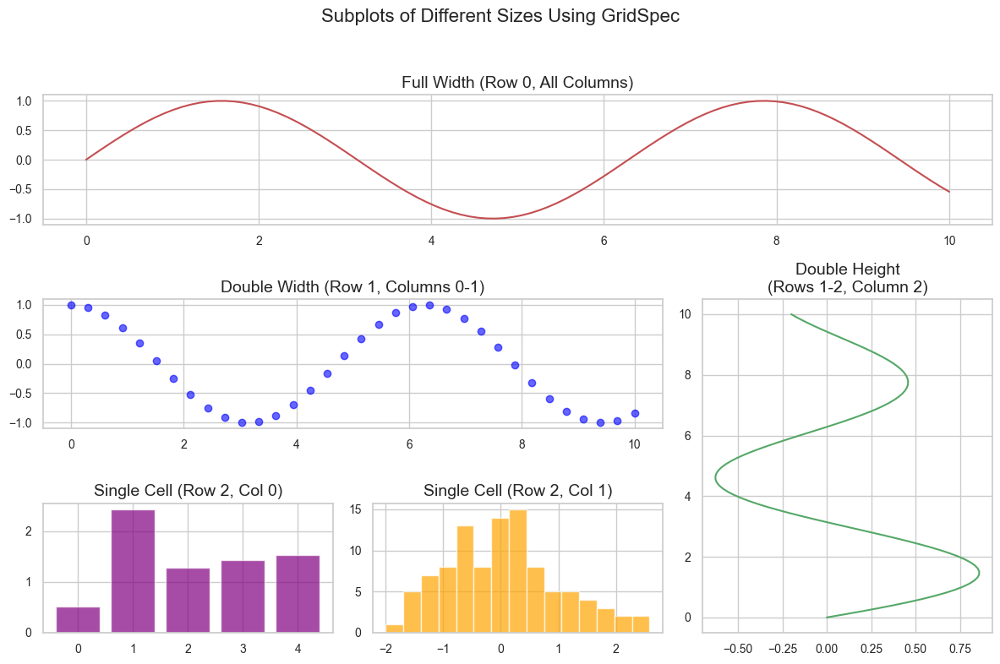

In [13]:
# Create a complex layout with subplots of different sizes
fig = plt.figure(figsize=(12, 8))

# Create a 3x3 grid
gs = gridspec.GridSpec(3, 3)

# Create subplots of different sizes by spanning across cells
ax1 = fig.add_subplot(gs[0, :])  # Span all columns in the first row
ax2 = fig.add_subplot(gs[1, 0:2])  # Span first two columns in second row
ax3 = fig.add_subplot(gs[1:3, 2])  # Span last column in second and third rows
ax4 = fig.add_subplot(gs[2, 0])  # Single cell in the bottom left
ax5 = fig.add_subplot(gs[2, 1])  # Single cell in the bottom middle

# Add content to each subplot
ax1.plot(x, y1, 'r-')
ax1.set_title('Full Width (Row 0, All Columns)')

ax2.scatter(x[::3], y2[::3], c='blue', alpha=0.6)
ax2.set_title('Double Width (Row 1, Columns 0-1)')

ax3.plot(y3, x, 'g-')
ax3.set_title('Double Height\n(Rows 1-2, Column 2)')

ax4.bar(np.arange(5), np.random.rand(5)*5, color='purple', alpha=0.7)
ax4.set_title('Single Cell (Row 2, Col 0)')

ax5.hist(np.random.normal(0, 1, 100), bins=15, color='orange', alpha=0.7)
ax5.set_title('Single Cell (Row 2, Col 1)')

fig.suptitle('Subplots of Different Sizes Using GridSpec', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

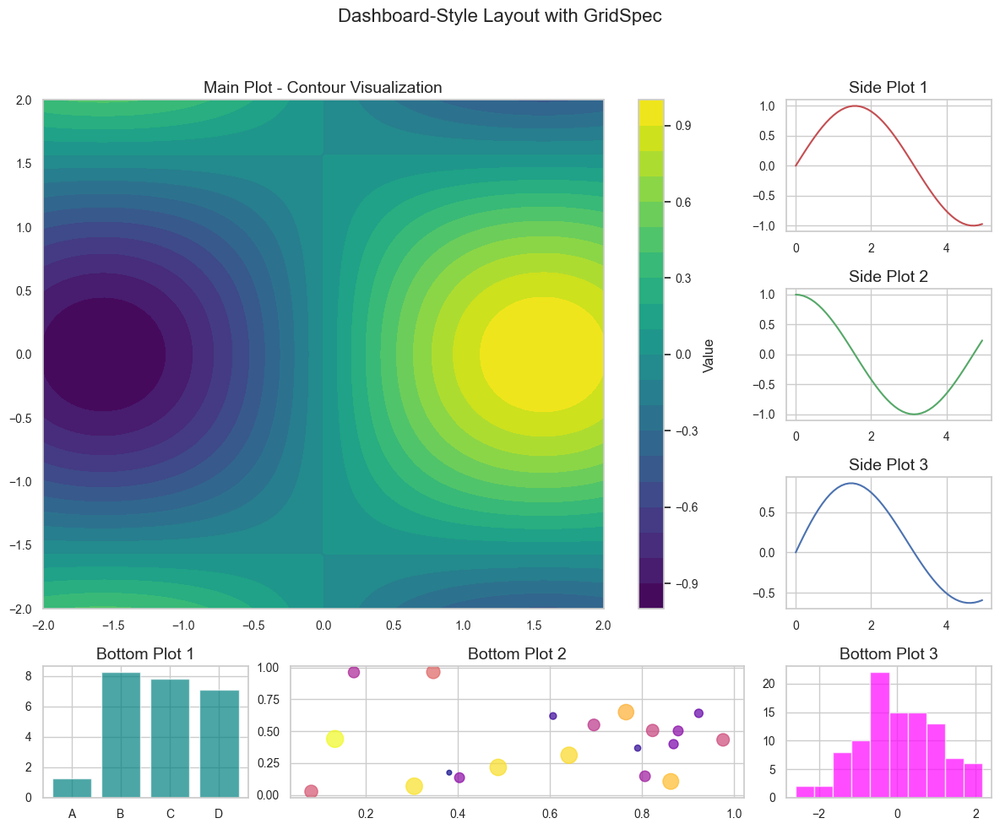

In [14]:
# Another complex layout example: Dashboard-like arrangement
fig = plt.figure(figsize=(12, 10))

# Create custom grid layout
gs = gridspec.GridSpec(4, 4)

# Main plot spanning most of the figure
ax_main = fig.add_subplot(gs[0:3, 0:3])

# Side bar plots
ax_side1 = fig.add_subplot(gs[0, 3])
ax_side2 = fig.add_subplot(gs[1, 3])
ax_side3 = fig.add_subplot(gs[2, 3])

# Bottom row plots
ax_bottom1 = fig.add_subplot(gs[3, 0])
ax_bottom2 = fig.add_subplot(gs[3, 1:3])
ax_bottom3 = fig.add_subplot(gs[3, 3])

# Add content to each subplot
# Main plot - contour plot
x_grid, y_grid = np.meshgrid(np.linspace(-2, 2, 100), np.linspace(-2, 2, 100))
z_grid = np.sin(x_grid) * np.cos(y_grid)
main_plot = ax_main.contourf(x_grid, y_grid, z_grid, cmap='viridis', levels=20)
ax_main.set_title('Main Plot - Contour Visualization')
fig.colorbar(main_plot, ax=ax_main, label='Value')

# Side plots
ax_side1.plot(x[:50], y1[:50], 'r-')
ax_side1.set_title('Side Plot 1')

ax_side2.plot(x[:50], y2[:50], 'g-')
ax_side2.set_title('Side Plot 2')

ax_side3.plot(x[:50], y3[:50], 'b-')
ax_side3.set_title('Side Plot 3')

# Bottom plots
ax_bottom1.bar(['A', 'B', 'C', 'D'], np.random.rand(4)*10, color='teal', alpha=0.7)
ax_bottom1.set_title('Bottom Plot 1')

# Scatter plot with size variation
sizes = np.random.rand(20) * 200 + 10
ax_bottom2.scatter(np.random.rand(20), np.random.rand(20), 
                   s=sizes, c=sizes, cmap='plasma', alpha=0.7)
ax_bottom2.set_title('Bottom Plot 2')

ax_bottom3.hist(np.random.normal(0, 1, 100), bins=10, color='magenta', alpha=0.7)
ax_bottom3.set_title('Bottom Plot 3')

fig.suptitle('Dashboard-Style Layout with GridSpec', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

## 7. Shared Axes Between Subplots

When comparing data across multiple plots, it's often useful to share axes between subplots to ensure consistent scales and reduce redundant labeling.

Matplotlib provides built-in support for sharing x-axes, y-axes, or both using the `sharex` and `sharey` parameters in `plt.subplots()`.

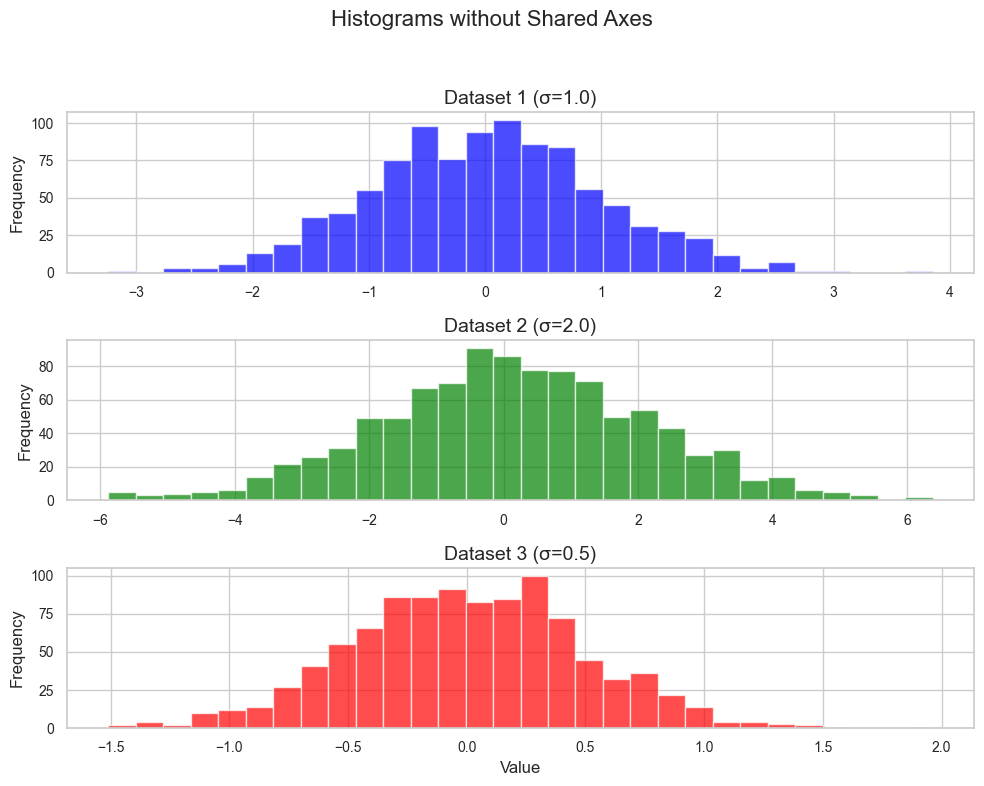

In [15]:
# Create random data with different scales
np.random.seed(42)
data1 = np.random.normal(0, 1, 1000)
data2 = np.random.normal(0, 2, 1000)
data3 = np.random.normal(0, 0.5, 1000)

# First example: No shared axes (default behavior)
fig, axs = plt.subplots(3, 1, figsize=(10, 8))

axs[0].hist(data1, bins=30, color='blue', alpha=0.7)
axs[0].set_title('Dataset 1 (σ=1.0)')

axs[1].hist(data2, bins=30, color='green', alpha=0.7)
axs[1].set_title('Dataset 2 (σ=2.0)')

axs[2].hist(data3, bins=30, color='red', alpha=0.7)
axs[2].set_title('Dataset 3 (σ=0.5)')
axs[2].set_xlabel('Value')

for ax in axs:
    ax.set_ylabel('Frequency')

fig.suptitle('Histograms without Shared Axes', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

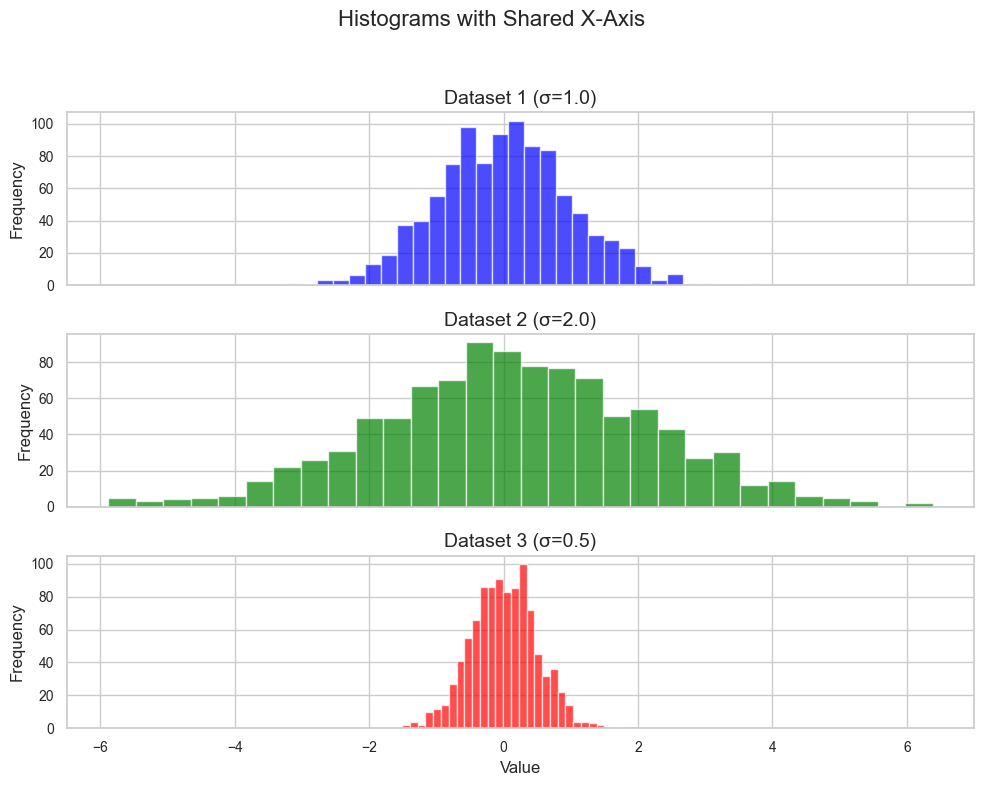

In [16]:
# Second example: Shared x-axis
fig, axs = plt.subplots(3, 1, figsize=(10, 8), sharex=True)

axs[0].hist(data1, bins=30, color='blue', alpha=0.7)
axs[0].set_title('Dataset 1 (σ=1.0)')

axs[1].hist(data2, bins=30, color='green', alpha=0.7)
axs[1].set_title('Dataset 2 (σ=2.0)')

axs[2].hist(data3, bins=30, color='red', alpha=0.7)
axs[2].set_title('Dataset 3 (σ=0.5)')
axs[2].set_xlabel('Value')

for ax in axs:
    ax.set_ylabel('Frequency')

fig.suptitle('Histograms with Shared X-Axis', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

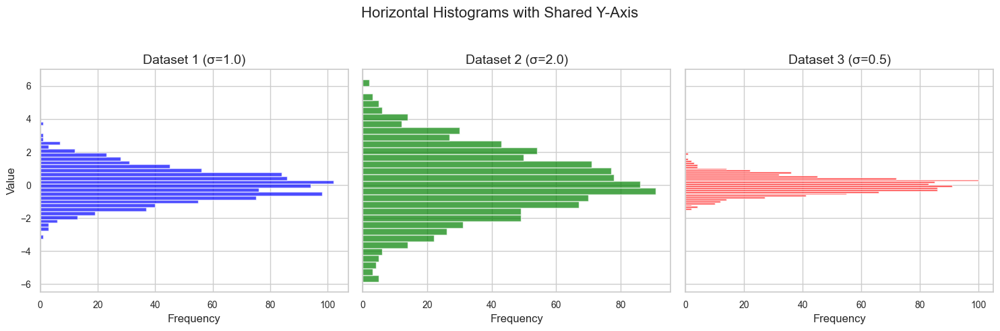

In [17]:
# Third example: Shared y-axis
fig, axs = plt.subplots(1, 3, figsize=(15, 5), sharey=True)

axs[0].hist(data1, bins=30, color='blue', alpha=0.7, orientation='horizontal')
axs[0].set_title('Dataset 1 (σ=1.0)')
axs[0].set_xlabel('Frequency')

axs[1].hist(data2, bins=30, color='green', alpha=0.7, orientation='horizontal')
axs[1].set_title('Dataset 2 (σ=2.0)')
axs[1].set_xlabel('Frequency')

axs[2].hist(data3, bins=30, color='red', alpha=0.7, orientation='horizontal')
axs[2].set_title('Dataset 3 (σ=0.5)')
axs[2].set_xlabel('Frequency')

axs[0].set_ylabel('Value')

fig.suptitle('Horizontal Histograms with Shared Y-Axis', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

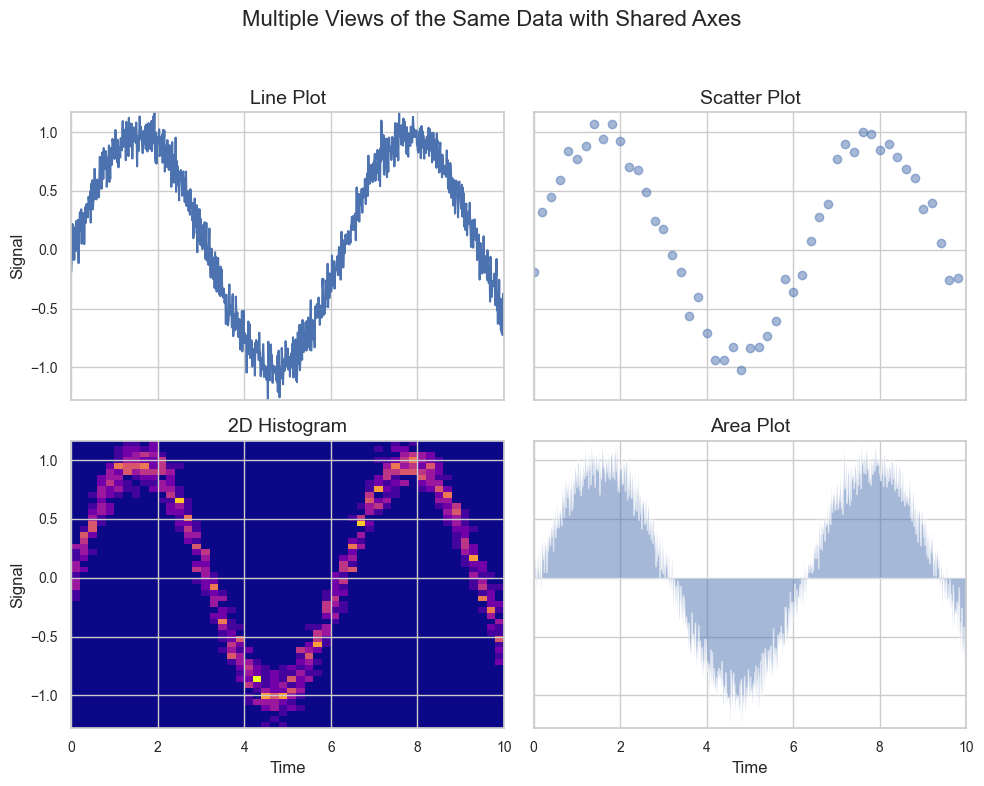

In [18]:
# Fourth example: Shared x and y axes with different visualizations
fig, axs = plt.subplots(2, 2, figsize=(10, 8), sharex=True, sharey=True)

# Create a custom dataset
t = np.linspace(0, 10, 1000)
signal = np.sin(t) + 0.1 * np.random.randn(1000)

# Different ways to visualize the same data
axs[0, 0].plot(t, signal)
axs[0, 0].set_title('Line Plot')

axs[0, 1].scatter(t[::20], signal[::20], alpha=0.5)
axs[0, 1].set_title('Scatter Plot')

# Display a 2D histogram/heatmap
h, xedges, yedges = np.histogram2d(t, signal, bins=(50, 50))
axs[1, 0].imshow(h.T, aspect='auto', origin='lower', 
                extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],
                cmap='plasma')
axs[1, 0].set_title('2D Histogram')

# Show a filled area plot
axs[1, 1].fill_between(t, 0, signal, alpha=0.5)
axs[1, 1].set_title('Area Plot')

# Only add labels to the bottom and left plots
for ax in axs[-1, :]:
    ax.set_xlabel('Time')
for ax in axs[:, 0]:
    ax.set_ylabel('Signal')

fig.suptitle('Multiple Views of the Same Data with Shared Axes', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

## 8. Specialized Multi-plot Layouts

Beyond regular grids, matplotlib supports specialized multi-plot layouts such as:
- Inset plots (small plots inside a main plot)
- Plots with secondary y-axes
- Combined plot types (e.g., line plots with histograms)

Let's explore these specialized layouts:

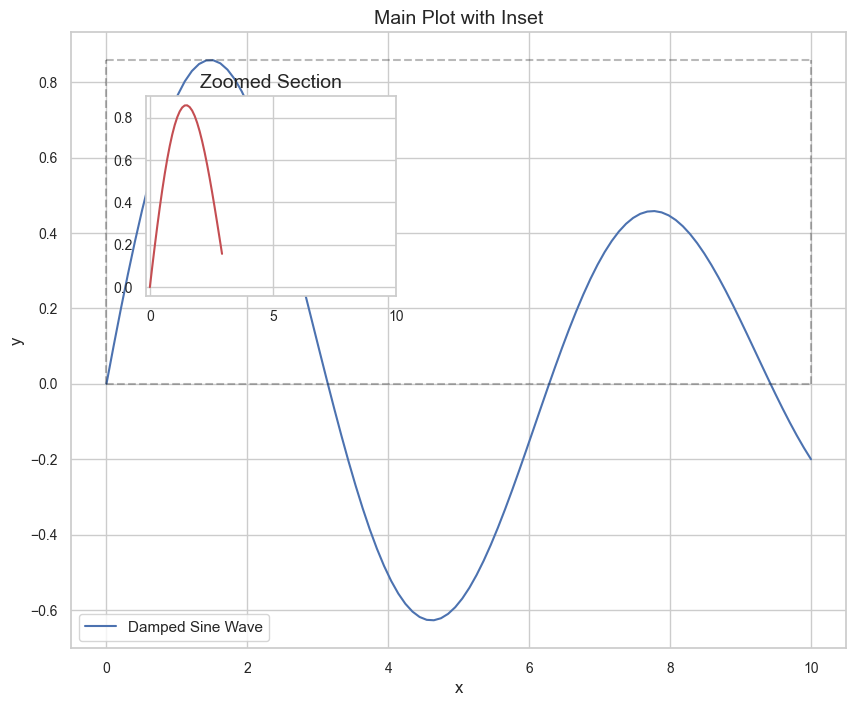

In [19]:
# Example 1: Main plot with an inset
fig, ax_main = plt.subplots(figsize=(10, 8))

# Create main plot
ax_main.plot(x, y3, 'b-', label='Damped Sine Wave')
ax_main.set_title('Main Plot with Inset', fontsize=14)
ax_main.set_xlabel('x')
ax_main.set_ylabel('y')
ax_main.legend()

# Create inset plot
# Arguments: [left, bottom, width, height] in figure coordinates
ax_inset = fig.add_axes([0.2, 0.55, 0.25, 0.25])  # These are normalized coordinates
ax_inset.plot(x[:30], y3[:30], 'r-')
ax_inset.set_title('Zoomed Section')
ax_inset.set_xticks([0, 5, 10])
ax_inset.grid(True)

# Indicate the zoomed region in the main plot
ax_main.plot([0, 10], [max(y3[:30]), max(y3[:30])], 'k--', alpha=0.3)
ax_main.plot([0, 0], [min(y3[:30]), max(y3[:30])], 'k--', alpha=0.3)
ax_main.plot([10, 10], [min(y3[:30]), max(y3[:30])], 'k--', alpha=0.3)
ax_main.plot([0, 10], [min(y3[:30]), min(y3[:30])], 'k--', alpha=0.3)

plt.show()

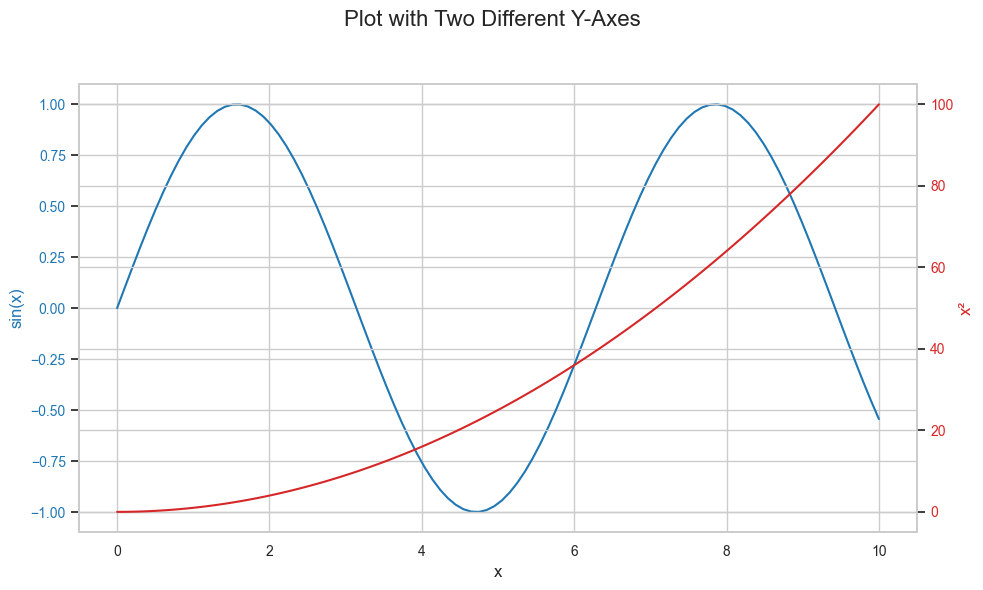

In [20]:
# Example 2: Plot with two different y-axes
fig, ax1 = plt.subplots(figsize=(10, 6))

# First plot on the primary y-axis (left)
color = 'tab:blue'
ax1.set_xlabel('x')
ax1.set_ylabel('sin(x)', color=color)
ax1.plot(x, y1, color=color)
ax1.tick_params(axis='y', labelcolor=color)

# Create a secondary y-axis (right)
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('x²', color=color)
ax2.plot(x, x**2, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.suptitle('Plot with Two Different Y-Axes', fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

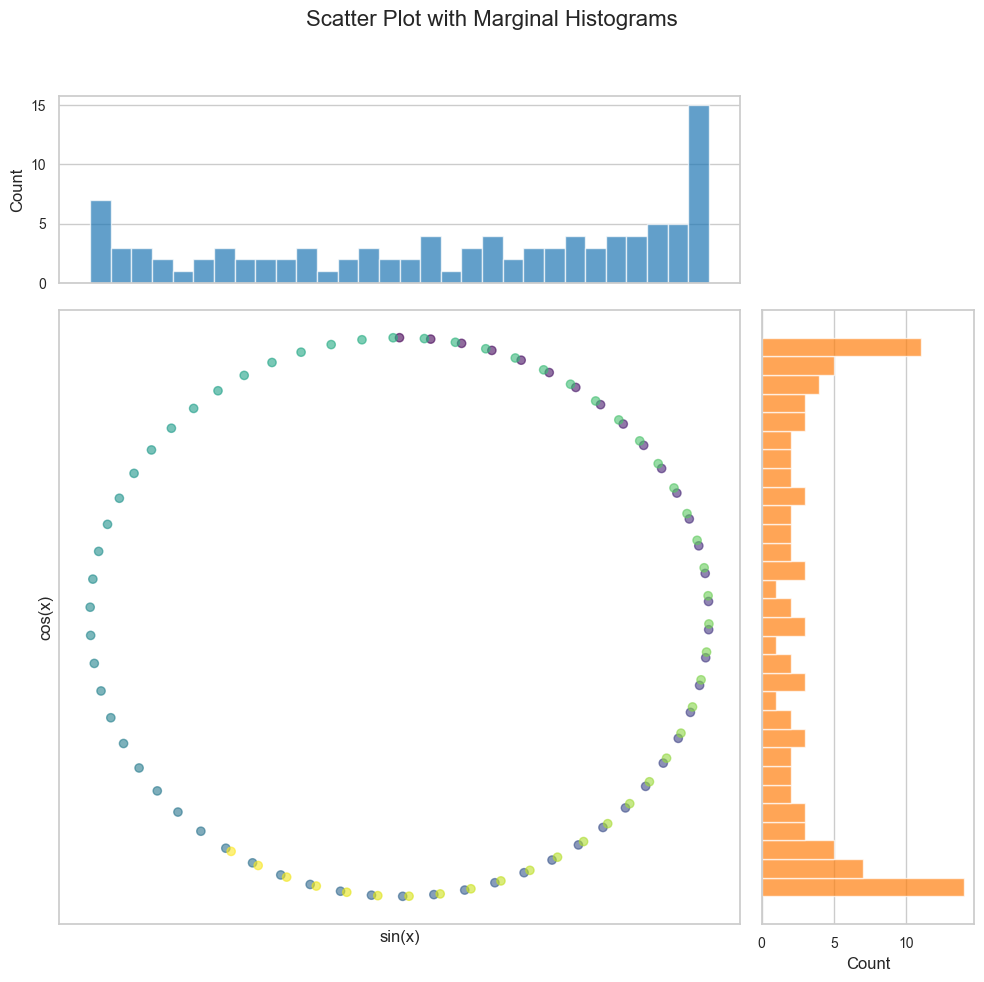

In [21]:
# Example 3: Combination of different plot types - Line plot with marginal histograms
# This is a more complex layout that mimics what seaborn's jointplot provides

fig = plt.figure(figsize=(10, 10))

# Create a custom layout
gs = gridspec.GridSpec(4, 4)

# Main scatter plot
ax_main = fig.add_subplot(gs[1:4, 0:3])
ax_main.scatter(y1, y2, c=x, cmap='viridis', alpha=0.6)
ax_main.set_xlabel('sin(x)')
ax_main.set_ylabel('cos(x)')

# Top histogram for y1 (sin)
ax_top = fig.add_subplot(gs[0, 0:3], sharex=ax_main)
ax_top.hist(y1, bins=30, color='tab:blue', alpha=0.7)
ax_top.set_xticks([])  # Hide x ticks for the top histogram
ax_top.set_ylabel('Count')

# Right histogram for y2 (cos)
ax_right = fig.add_subplot(gs[1:4, 3], sharey=ax_main)
ax_right.hist(y2, bins=30, color='tab:orange', alpha=0.7, orientation='horizontal')
ax_right.set_yticks([])  # Hide y ticks for the right histogram
ax_right.set_xlabel('Count')

# Hide the empty top-right subplot
ax_empty = fig.add_subplot(gs[0, 3])
ax_empty.set_visible(False)

fig.suptitle('Scatter Plot with Marginal Histograms', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

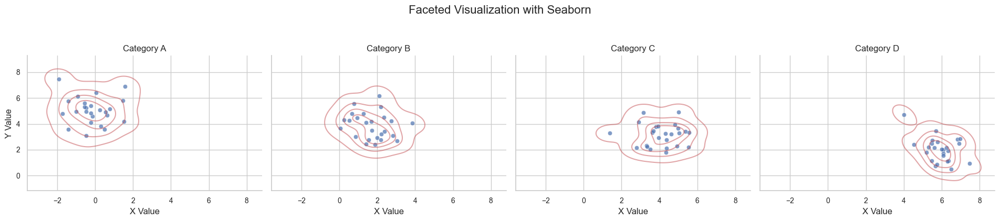

In [22]:
# Example 4: Multi-faceted visualization with seaborn

# Create a more complex dataset for demonstration
np.random.seed(42)
n = 100
categories = np.repeat(['A', 'B', 'C', 'D'], n//4)
x_values = np.concatenate([
    np.random.normal(0, 1, n//4),  # Category A
    np.random.normal(2, 1, n//4),  # Category B
    np.random.normal(4, 1, n//4),  # Category C
    np.random.normal(6, 1, n//4)   # Category D
])
y_values = np.concatenate([
    np.random.normal(5, 1, n//4),  # Category A
    np.random.normal(4, 1, n//4),  # Category B
    np.random.normal(3, 1, n//4),  # Category C
    np.random.normal(2, 1, n//4)   # Category D
])

# Create a DataFrame
data = pd.DataFrame({
    'Category': categories,
    'x': x_values,
    'y': y_values
})

# Create FacetGrid with categorical data
g = sns.FacetGrid(data, col="Category", height=4, aspect=1.2)

# Map different visualizations to each facet
g.map_dataframe(sns.scatterplot, x="x", y="y", alpha=0.7)
g.map_dataframe(sns.kdeplot, x="x", y="y", levels=5, color="r", alpha=0.5)

# Add a title
g.fig.suptitle("Faceted Visualization with Seaborn", y=1.05, fontsize=16)

# Improve appearance
g.set_axis_labels("X Value", "Y Value")
g.set_titles(col_template="Category {col_name}")
g.tight_layout()

plt.show()

## 9. Adding Suptitles and Figure Texts

Adding comprehensive titles, annotations, and explanatory text helps make your visualizations self-explanatory. This section explores various ways to add text elements to multi-plot figures.

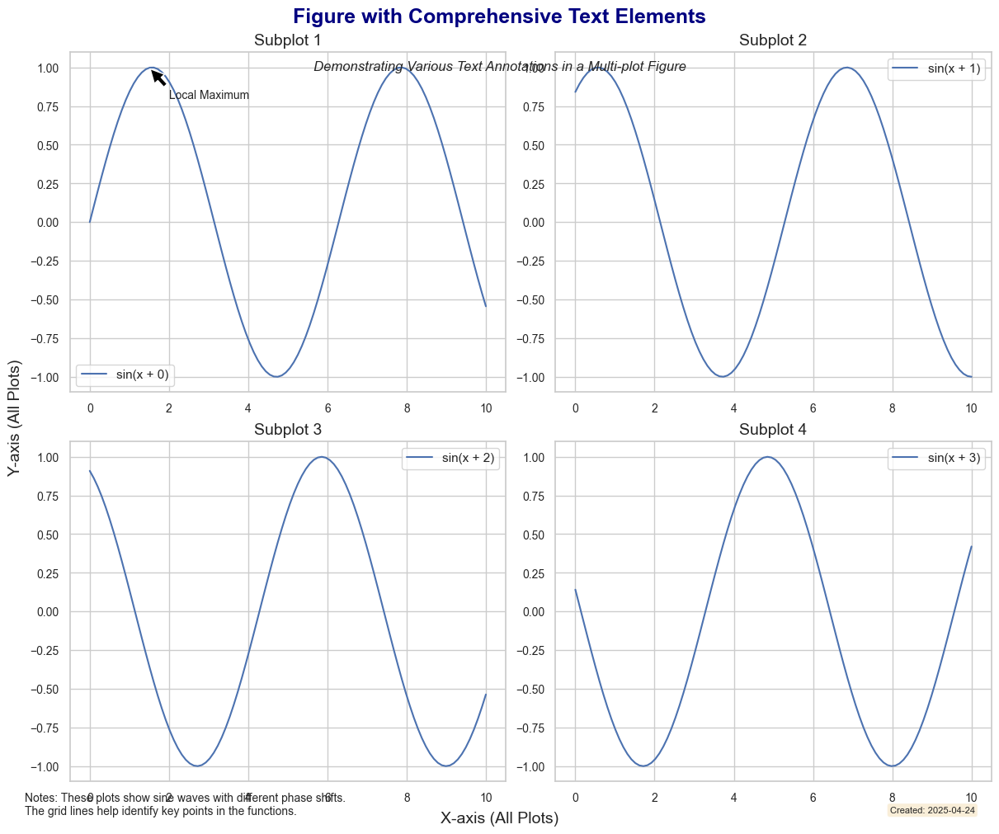

In [23]:
# Create a figure with 4 subplots for demonstration
fig, axs = plt.subplots(2, 2, figsize=(12, 10), constrained_layout=True)

# Plot some data
for i, ax in enumerate(axs.flatten()):
    ax.plot(x, np.sin(x + i), label=f'sin(x + {i})')
    ax.set_title(f'Subplot {i+1}')
    ax.legend()
    ax.grid(True)

# Add a main title (suptitle)
fig.suptitle('Figure with Comprehensive Text Elements', 
             fontsize=18, fontweight='bold', color='navy')

# Add a subtitle
fig.text(0.5, 0.92, 'Demonstrating Various Text Annotations in a Multi-plot Figure', 
         ha='center', fontsize=12, fontstyle='italic')

# Add figure-level x and y labels
fig.supxlabel('X-axis (All Plots)', fontsize=14)
fig.supylabel('Y-axis (All Plots)', fontsize=14)

# Add explanatory text in the figure
fig.text(0.02, 0.02, 
         'Notes: These plots show sine waves with different phase shifts.\n'
         'The grid lines help identify key points in the functions.', 
         fontsize=10, wrap=True)

# Add a text box with a border
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
fig.text(0.98, 0.02, 'Created: ' + pd.Timestamp.now().strftime('%Y-%m-%d'),
         fontsize=8, bbox=props, ha='right')

# Add an arrow pointing to an interesting feature
axs[0, 0].annotate('Local Maximum',
                  xy=(1.5, np.sin(1.5)), xytext=(2, 0.8),
                  arrowprops=dict(facecolor='black', shrink=0.05),
                  fontsize=10)

plt.show()

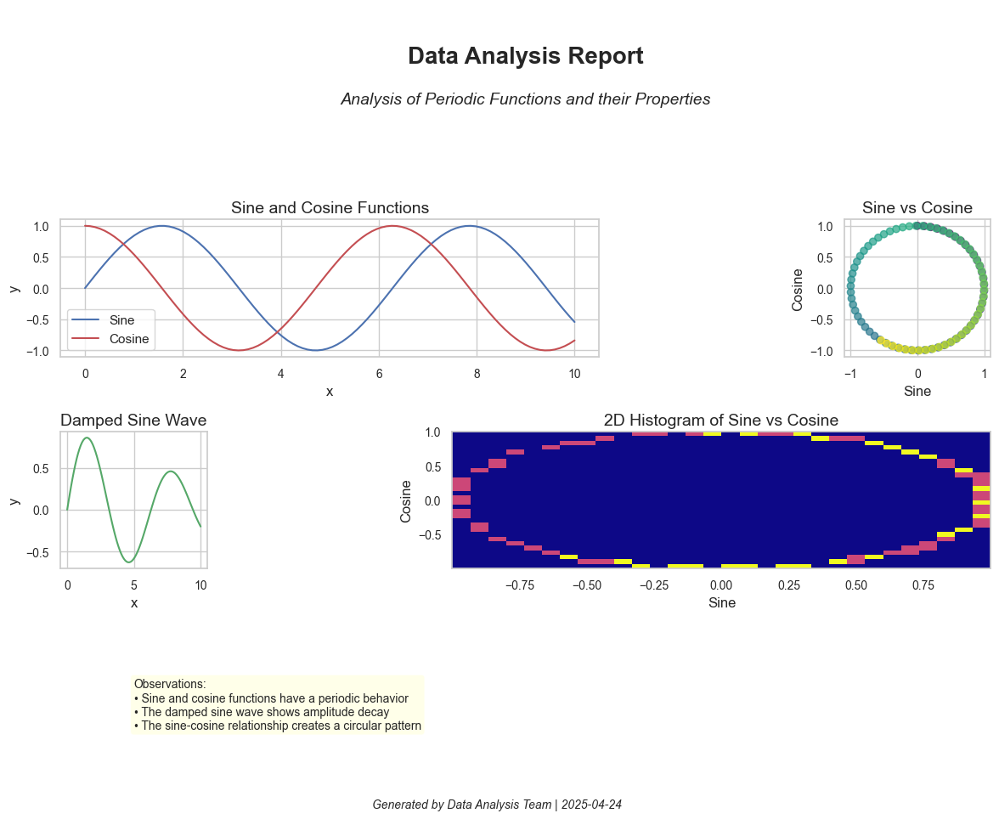

In [24]:
# Create a report-like figure with multiple text elements and annotations
fig = plt.figure(figsize=(12, 10))

# Create layout
gs = gridspec.GridSpec(3, 3)

# Main title area
title_ax = fig.add_subplot(gs[0, :])
title_ax.axis('off')  # Hide axes
title_ax.text(0.5, 0.6, 'Data Analysis Report', fontsize=20, fontweight='bold', ha='center')
title_ax.text(0.5, 0.3, 'Analysis of Periodic Functions and their Properties', 
             fontsize=14, ha='center', fontstyle='italic')

# Main content plots
ax1 = fig.add_subplot(gs[1, 0:2])
ax1.plot(x, y1, 'b-', label='Sine')
ax1.plot(x, y2, 'r-', label='Cosine')
ax1.set_title('Sine and Cosine Functions')
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax1.legend()
ax1.grid(True)

ax2 = fig.add_subplot(gs[1, 2])
ax2.scatter(y1, y2, c=x, cmap='viridis', alpha=0.7)
ax2.set_title('Sine vs Cosine')
ax2.set_xlabel('Sine')
ax2.set_ylabel('Cosine')
ax2.grid(True)

ax3 = fig.add_subplot(gs[2, 0])
ax3.plot(x, y3, 'g-')
ax3.set_title('Damped Sine Wave')
ax3.set_xlabel('x')
ax3.set_ylabel('y')
ax3.grid(True)

ax4 = fig.add_subplot(gs[2, 1:])
ax4.hist2d(y1, y2, bins=30, cmap='plasma')
ax4.set_title('2D Histogram of Sine vs Cosine')
ax4.set_xlabel('Sine')
ax4.set_ylabel('Cosine')

# Add explanatory text boxes
text_box1 = (
    "Observations:\n"
    "• Sine and cosine functions have a periodic behavior\n"
    "• The damped sine wave shows amplitude decay\n"
    "• The sine-cosine relationship creates a circular pattern"
)
props = dict(boxstyle='round', facecolor='lightyellow', alpha=0.7)
ax3.text(0.5, -0.8, text_box1, transform=ax3.transAxes, fontsize=10,
        verticalalignment='top', bbox=props)

# Add a footer with metadata
plt.figtext(0.5, 0.01, 'Generated by Data Analysis Team | ' + 
            pd.Timestamp.now().strftime('%Y-%m-%d'), ha='center', 
            fontsize=10, fontstyle='italic')

plt.tight_layout(rect=[0, 0.03, 1, 0.97])  # Adjust layout to accommodate footer
plt.show()

## 10. Interactive Multi-plot Dashboards

For interactive visualizations, Plotly provides powerful tools to create responsive, interactive multi-plot dashboards. These are especially useful for web-based applications or interactive reports.

In [25]:
# Create an interactive subplot grid with Plotly
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=("Line Plot", "Scatter Plot", "Bar Chart", "Histogram"),
    vertical_spacing=0.1,
    horizontal_spacing=0.1
)

# Top-left plot: Line plot
fig.add_trace(
    go.Scatter(x=x, y=y1, mode='lines', name='Sine'),
    row=1, col=1
)
fig.add_trace(
    go.Scatter(x=x, y=y2, mode='lines', name='Cosine', line=dict(dash='dash')),
    row=1, col=1
)

# Top-right plot: Scatter plot
fig.add_trace(
    go.Scatter(
        x=y1[::3], 
        y=y2[::3], 
        mode='markers',
        marker=dict(
            size=10,
            color=x[::3],
            colorscale='Viridis',
            showscale=True
        ),
        name='Sine vs Cosine'
    ),
    row=1, col=2
)

# Bottom-left plot: Bar chart
categories = ['A', 'B', 'C', 'D', 'E']
values = np.random.randint(10, 30, size=5)
fig.add_trace(
    go.Bar(x=categories, y=values, name='Categories'),
    row=2, col=1
)

# Bottom-right plot: Histogram
fig.add_trace(
    go.Histogram(x=np.random.normal(0, 1, 1000), nbinsx=30, name='Distribution'),
    row=2, col=2
)

# Update layout for better appearance
fig.update_layout(
    title_text="Interactive Multi-plot Dashboard with Plotly",
    height=800,
    width=1000,
    showlegend=False
)

# Set y-axis titles
fig.update_yaxes(title_text="Value", row=1, col=1)
fig.update_yaxes(title_text="Cosine", row=1, col=2)
fig.update_yaxes(title_text="Count", row=2, col=1)
fig.update_yaxes(title_text="Frequency", row=2, col=2)

# Set x-axis titles
fig.update_xaxes(title_text="x", row=1, col=1)
fig.update_xaxes(title_text="Sine", row=1, col=2)
fig.update_xaxes(title_text="Category", row=2, col=1)
fig.update_xaxes(title_text="Value", row=2, col=2)

fig.show()

In [26]:
# Create a more complex interactive dashboard with subplot domain calculations

# Create sample time-series data
dates = pd.date_range(start='2023-01-01', periods=100, freq='D')
trend = np.cumsum(np.random.normal(0, 0.5, 100))
seasonal = 3 * np.sin(np.linspace(0, 4*np.pi, 100))
noise = np.random.normal(0, 1, 100)
time_series = trend + seasonal + noise

# Create a more advanced dashboard with subplot specifications
fig = make_subplots(
    rows=3, cols=3,
    specs=[
        [{"colspan": 3}, None, None],                 # First row has one plot spanning all columns
        [{"colspan": 2}, None, {"rowspan": 2}],       # Second row has a double-width plot and a double-height plot
        [{"colspan": 2}, None, None],                 # Third row continues the double-height plot
    ],
    subplot_titles=("Time Series Overview", "Trend Component", "Statistical Distribution", 
                   "Component Breakdown")
)

# Add main time series plot (spanning all columns in first row)
fig.add_trace(
    go.Scatter(x=dates, y=time_series, mode='lines', name='Time Series'),
    row=1, col=1
)

# Add trend component (spanning 2 columns in second row)
fig.add_trace(
    go.Scatter(x=dates, y=trend, mode='lines', name='Trend', line=dict(color='red')),
    row=2, col=1
)

# Add histogram (in third column, spanning second and third rows)
fig.add_trace(
    go.Histogram(x=time_series, nbinsx=20, name='Distribution'),
    row=2, col=3
)

# Add component breakdown (spanning 2 columns in third row)
fig.add_trace(
    go.Scatter(x=dates, y=seasonal, mode='lines', name='Seasonal', line=dict(color='green')),
    row=3, col=1
)
fig.add_trace(
    go.Scatter(x=dates, y=noise, mode='lines', name='Noise', line=dict(color='purple', dash='dot')),
    row=3, col=1
)

# Update layout for better appearance
fig.update_layout(
    title_text="Interactive Time Series Analysis Dashboard",
    height=900,
    width=1000,
    showlegend=True,
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    )
)

# Update axes titles
fig.update_yaxes(title_text="Value", row=1, col=1)
fig.update_yaxes(title_text="Trend Value", row=2, col=1)
fig.update_yaxes(title_text="Frequency", row=2, col=3)
fig.update_yaxes(title_text="Component Value", row=3, col=1)

fig.update_xaxes(title_text="Date", row=1, col=1)
fig.update_xaxes(title_text="Date", row=2, col=1)
fig.update_xaxes(title_text="Value", row=2, col=3)
fig.update_xaxes(title_text="Date", row=3, col=1)

# Add annotations
fig.add_annotation(
    x=0.5, y=1.12,
    xref="paper", yref="paper",
    text="Interactive dashboard showing time series decomposition",
    showarrow=False,
    font=dict(size=14, color="gray"),
    align="center"
)

fig.show()

## Summary

In this notebook, we've explored various techniques for creating multiple plots and subplots using Python's visualization libraries:

1. **Basic subplot creation** using matplotlib's `plt.subplots()` function
2. **Understanding Figure and Axes** objects and their hierarchy
3. **Creating different grid layouts** with regular grids and GridSpec
4. **Adjusting subplot spacing** for cleaner visualizations
5. **Creating subplots of different sizes** for emphasis and better data storytelling
6. **Sharing axes** between related plots
7. **Creating specialized layouts** like inset plots and combination plots
8. **Adding comprehensive titles** and annotations
9. **Building interactive dashboards** with Plotly

These techniques allow you to create complex, information-rich visualizations that effectively communicate your data insights.

## Additional Resources

- **Matplotlib Documentation**:
  - [Subplots Guide](https://matplotlib.org/stable/gallery/subplots_axes_and_figures/subplots_demo.html)
  - [GridSpec Tutorial](https://matplotlib.org/stable/tutorials/intermediate/gridspec.html)
  - [Constrained Layout Guide](https://matplotlib.org/stable/users/explain/axes/constrainedlayout_guide.html)

- **Seaborn Documentation**:
  - [FacetGrid Tutorial](https://seaborn.pydata.org/tutorial/facets.html)
  - [Multi-plot Grids](https://seaborn.pydata.org/tutorial/axis_grids.html)

- **Plotly Documentation**:
  - [Subplots in Plotly](https://plotly.com/python/subplots/)
  - [Custom Subplot Layouts](https://plotly.com/python/custom-subplot-layouts/)